In [1]:
import pathlib
from SE3Lie import *
import numpy as np
from sympy import *
from pyecca.lie import so3, r3, se3
from pyecca.lie.util import DirectProduct
from pyecca.lie.so3 import Quat, Dcm, Euler, Mrp
from pyecca.lie.r3 import R3
from pyecca.lie.se3 import SE3
from pyecca.test import test_lie
import casadi as ca
from SE3Lie import se3, SE3, se3_diff_correction_inv, dot_plot_draw
from casadi.tools.graph import graph, dotdraw
import os
import pydot
from PIL import Image

In [55]:
r = ca.DM([0.1, 0.2, 0.3])
v = ca.DM([0.1, 0.2, 0.3])
R = Dcm.from_euler(ca.DM([0.1, 0.2, 0.3]))
inp = ca.horzcat(np.transpose(r),np.transpose(v))
veeSe3 = np.transpose(inp)
uInv = se3_diff_correction_inv(veeSe3)

In [56]:
# Linearize UInv
# F = ca.sparsify(ca.substitute(ca.jacobian(uInv)))

# Require pydot and graphviz to be installed in conda environment
F = ca.sparsify(uInv)

output_dir = '/home/wsribunm/Desktop/NASA_ULI/' #change directory if needed
os.makedirs(output_dir, exist_ok=True)
g = graph.dotgraph(uInv)
g.set('dpi', 180)
#g.write_png('casadi_graph_uInv.png')
g.write_png(os.path.join(output_dir, 'casadi_graph_uInv.png'))

In [58]:
x = ca.SX.sym('x')
y = ca.SX.sym('y')
z = ca.SX.sym('z')
theta1= ca.SX.sym('theta1')
theta2 = ca.SX.sym('theta2')
theta3 = ca.SX.sym('theta3')
veeSym = ca.vertcat(x,y,z,theta1,theta2,theta3)
sym_uInv = se3_diff_correction_inv(veeSym)
# symUinv = se3_diff_correction_inv(ca.SX[x,y,z,theta1,theta2,theta3])

In [61]:
## Compute symbolically

# Linearize UInv
# F = ca.sparsify(ca.substitute(ca.jacobian(uInv)))
F = ca.sparsify(sym_uInv)

output_dir = '/home/wsribunm/Desktop/NASA_ULI/' #change directory if needed
os.makedirs(output_dir, exist_ok=True)
g = graph.dotgraph(F)
g.set('dpi', 180)
#g.write_png('casadi_graph_uInv.png')
g.write_png(os.path.join(output_dir, 'sym_casadi_graph_uInv.png'))

"dot" with args ['-Tpng', '/tmp/tmpe6faw0_7'] returned code: 1

stdout, stderr:
 b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00%\x9d\x00\x00\n\xc9\x08\x06\x00\x00\x00j\x82L\xec\x00\x00\x00\x06bKGD\x00\xff\x00\xff\x00\xff\xa0\xbd\xa7\x93\x00\x00 \x00IDATx\x9c\xec\xdcyp\xdcg}\xc7\xf1\xcf\xeaZ\xadv\xb5\xbb\x92vW\xf7i\xeb\x96|H\xce\xe4r\xec\xd2\xe2`\xf0\x90\x84\x02\xc3\x99\xb4\xd0@\x19\x98\x81\xd2\xa1C\x99N\x80\x92\x0eS \x1c\xcd@!\xd0I3\x84aBC!\x07!\x8d\xb9\x12\xc7\xc1!\x91d\xcb\xba\x0f\xac\x95%\xad\xb4\x92\xd6\xdaC\x87WZ\xe9\xd7?:\xd9F\xf8\x8c-im\xe9\xfd\x9a\xf9\xce\xef\xf9=\xbf\xe7y~\x9fg%\xad~\xfb\xcf\x9a\x0c\xc30\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\x0b\xfe\xa4D\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\

AssertionError: "dot" with args ['-Tpng', '/tmp/tmpe6faw0_7'] returned code: 1

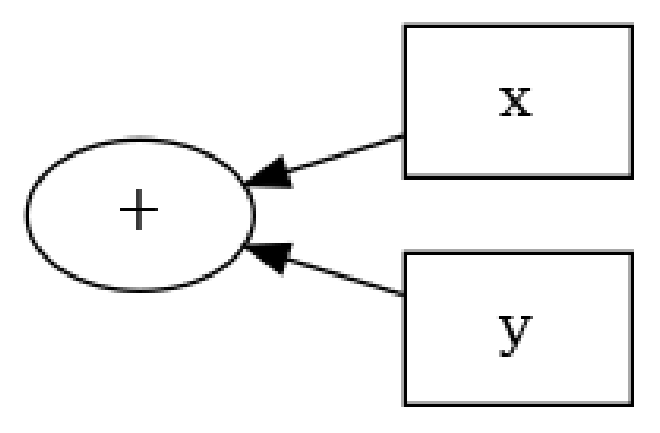

In [25]:
x = ca.SX.sym('x')
y = ca.SX.sym('y')
z = ca.SX.sym('z')
theta1= ca.SX.sym('theta1')
theta2 = ca.SX.sym('theta2')
theta3 = ca.SX.sym('theta3')
# symVee = se3_diff_correction_inv(np.matrix[x,y,z,theta1,theta2,theta3])
z = x + y
dotdraw(z)

In [37]:
y = ca.SX.sym('y',3)
r = ca.SX.sym('r',3)
v = ca.transpose(ca.vertcat(y,r))
v

SX([[y_0, y_1, y_2, r_0, r_1, r_2]])

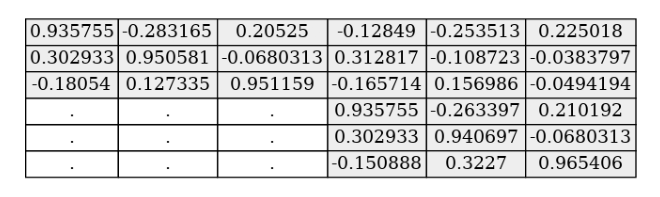

In [51]:
## Compute symbolically

# Linearize UInv
# F = ca.sparsify(ca.substitute(ca.jacobian(uInv)))
    # v = se3.vee(v)  #This only applies if v is inputed from Lie Group format
x = ca.SX.sym('x')
# y = ca.SX.sym('y')
# z = ca.SX.sym('z')
# theta1= ca.SX.sym('theta1')
# theta2 = ca.SX.sym('theta2')
# theta3 = ca.SX.sym('theta3')
# v = ca.SX.sym['x','y','z','theta1','theta2','theta3']
v = veeSe3

C1 = ca.Function('a', [x], [ca.if_else(ca.fabs(x) < eps, 1 - x ** 2 / 6 + x ** 4 / 120, ca.sin(x)/x)])
C2 = ca.Function('b', [x], [ca.if_else(ca.fabs(x) < eps, 0.5 - x ** 2 / 24 + x ** 4 / 720, (1 - ca.cos(x)) / x ** 2)])
del x
v_so3 = v[3:6] #grab only rotation terms for so3 uses ## changed to match NASAULI paper order of vee v[3:6]
X_so3 = so3.wedge(v_so3) #wedge operator for so3
theta = ca.norm_2(so3.vee(X_so3)) #theta term using norm for sqrt(theta1**2+theta2**2+theta3**2)

c1 = C1(theta)
c2 = C2(theta)

u_inv = ca.SX(6, 6)
u_inv[0,0] = c2*(-v[4]**2 - v[5]**2) + 1
u_inv[0,1] = -c1*v[5] + c2*v[3]*v[4]
u_inv[0,2] = c1 * v[4] + c2 * v[3]*v[4]
u_inv[0,3] = c2 * (-2*v[4]*v[1]-2*v[5]*v[2])
u_inv[0,4] = -c1 * v[2] + c2*(v[4]*v[0]+v[5]*v[1])
u_inv[0,5] = c1 * v[1] + c2*(v[3]*v[2]+v[5]*v[0])
    
u_inv[1,0] = c1 * v[5] + c2 * v[3] * v[4]
u_inv[1,1] = c2 *(-v[3]**2 - v[5]**2)+1
u_inv[1,2] = -c1*v[3] + c2 * v[4]*v[5]
u_inv[1,3] = c1 * v[2] + c2 * (v[3]*v[1]+v[4]*v[0])
u_inv[1,4] = c2* (-v[3] * v[0] - v[5]*v[0]-2*v[5]*v[2])
u_inv[1,5] = -c1 * v[0] + c2 * (v[4]*v[2] + v[5] *v[1])

u_inv[2,0] = -c1 * v[4] + c2 * v[3] * v[5]
u_inv[2,1] = c1 * v[3] + c2 * v[4] * v[5]
u_inv[2,2] = c1 * (-v[3] **2  - v[4]**2) +1
u_inv[2,3] = -c1 * v[1] + c2 * (v[3]*v[2] + v[5]*v[0])
u_inv[2,4] = c1 * v[0] + c2 * (v[4]*v[2] + v[5] *v[1])
u_inv[2,5] = c2 * (-2*v[3]*v[0] - 2*v[4] *v[1])

u_inv[3,3] = c2 * (- v[4]**2 - v[5]**2) +1
u_inv[3,4] = -c1*v[5] + c2*v[4]*v[5]
u_inv[3,5] = c1 * v[4] + c2 * v[3] * v[5]

u_inv[4,3] = c1 * v[5] + c2 * v[3] * v[4]
u_inv[4,4] = c2 * (-v[3]*v[5] - v[5]**2) +1
u_inv[4,5] = -c1 * v[3] + c2 * v[4] *v[5]

u_inv[5,3] = -c1 * v[4] + c2 * v[5]**2
u_inv[5,4] = c1 * v[5] + c2 * v[4] * v[5]
u_inv[5,5] = c2 * (-v[3] * v[5] - v[4]**2)+1

F = ca.sparsify(u_inv)

output_dir = '/home/wsribunm/Desktop/NASA ULI/' #change directory if needed
path = pathlib.Path('results')
os.makedirs(output_dir, exist_ok=True)
g = dotdraw(F)
# g.set('dpi', 180)
# g.write_png(os.path.join(output_dir, 'dotdraw_uInv.png'))
g

In [34]:
v

SX([v_0, v_1, v_2, v_3, v_4, v_5])

In [42]:
u_inv

SX(@1=1, @2=((sq(r_0)+sq(r_1))+sq(r_2)), @3=sqrt(@2), @4=1e-07, @5=(fabs(@3)<@4), @6=((@5?((0.5-(@2/24))+(sq(@2)/720)):0)+((!@5)?((@1-cos(@3))/@2):0)), @7=(fabs(@3)<@4), @8=((@7?((@1-(@2/6))+(sq(@2)/120)):0)+((!@7)?(sin(@3)/@3):0)), @9=-2, @10=2, 
[[(@1-(@6*(sq(r_1)+sq(r_2)))), (((@6*r_0)*r_1)-(@8*r_2)), ((@8*r_1)+((@6*r_0)*r_1)), (@6*(((@9*r_1)*y_1)-((@10*r_2)*y_2))), ((@6*((r_1*y_0)+(r_2*y_1)))-(@8*y_2)), ((@8*y_1)+(@6*((r_0*y_2)+(r_2*y_0))))], 
 [((@8*r_2)+((@6*r_0)*r_1)), (@1-(@6*(sq(r_0)+sq(r_2)))), (((@6*r_1)*r_2)-(@8*r_0)), ((@8*y_2)+(@6*((r_0*y_1)+(r_1*y_0)))), (-(@6*(((r_0*y_0)+(r_2*y_0))+((@10*r_2)*y_2)))), ((@6*((r_1*y_2)+(r_2*y_1)))-(@8*y_0))], 
 [(((@6*r_0)*r_2)-(@8*r_1)), ((@8*r_0)+((@6*r_1)*r_2)), (@1-(@8*(sq(r_0)+sq(r_1)))), ((@6*((r_0*y_2)+(r_2*y_0)))-(@8*y_1)), ((@8*y_0)+(@6*((r_1*y_2)+(r_2*y_1)))), (@6*(((@9*r_0)*y_0)-((@10*r_1)*y_1)))], 
 [00, 00, 00, (@1-(@6*(sq(r_1)+sq(r_2)))), (((@6*r_1)*r_2)-(@8*r_2)), ((@8*r_1)+((@6*r_0)*r_2))], 
 [00, 00, 00, ((@8*r_2)+((@6*r_

In [49]:
x = ca.SX.sym('x')
y = ca.SX.sym('y')
z = ca.SX.sym('z')
theta1= ca.SX.sym('theta1')
theta2 = ca.SX.sym('theta2')
theta3 = ca.SX.sym('theta3')

v = ca.SX
v

casadi.casadi.SX